In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
from PIL import Image

import torch
import torch.nn.functional as F

from llava.constants import IMAGE_TOKEN_INDEX, DEFAULT_IMAGE_TOKEN, DEFAULT_IM_START_TOKEN, DEFAULT_IM_END_TOKEN
from llava.conversation import conv_templates, SeparatorStyle
from llava.model.builder import load_pretrained_model
from llava.utils import disable_torch_init
from llava.mm_utils import process_images, tokenizer_image_token, get_model_name_from_path

from utils import (
    load_image, 
    aggregate_llm_attention, aggregate_vit_attention,
    heterogenous_stack,
    show_mask_on_image
)

/gpfs/users/restrepoda/.conda/envs/biomed-gpt/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


[2025-02-27 15:58:17,313] [INFO] [real_accelerator.py:110:get_accelerator] Setting ds_accelerator to cuda (auto detect)


In [2]:
from torchvision.transforms import ToPILImage, Grayscale

def show_image(img_tensor):
    image = ToPILImage()(Grayscale()(img_tensor[0]))

    #image = Image.open()
    
    # Display the image
    plt.imshow(image, cmap="gray")
    plt.axis('off') 
    plt.show()

    print(f'shape: {mimic_img_tensor.shape}')
    print()

In [3]:
from src.models import load_llava_med
model, processor = load_llava_med(model_id="microsoft/llava-med-v1.5-mistral-7b", quantization="16b", return_attention=True, return_logits=True, conv_mode = "mistral_instruct")

/gpfs/users/restrepoda/.conda/envs/biomed-gpt/lib/python3.11/site-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
You are using the legacy behaviour of the <class 'transformers.models.llama.tokenization_llama.LlamaTokenizer'>. This means that tokens that come after special tokens will not be properly handled. We recommend you to read the related pull request available at https://github.com/huggingface/transformers/pull/24565
You are using a model of type llava_mistral to instantiate a model of type llava. This is not supported for all configurations of models and can yield errors.
Loading checkpoint shards: 100%|██████████| 4/4 [01:16<00:00, 19.14s/it]
Some weights of LlavaLlamaForCausalLM were not initialized from the model checkpoint at microsoft/llava-med-v1.5-mistral-7b and are new

### Get sample data

In [4]:
from src.datasets import load_mimic, load_mbrset, load_medeval

metadata_test = load_mimic(train=False, validation=False, check_images=False)
row_mimic = metadata_test.iloc[0]

_, _, metadata_test = load_medeval()
row_medeval = metadata_test.iloc[0]

Loading MIMIC dataset from /gpfs/workdir/restrepoda/datasets/MIMIC
Reading test data...
Reading text from zip file...
Loading VLMed dataset from /gpfs/workdir/restrepoda/datasets/VLMed
Images are stored in /gpfs/workdir/restrepoda/datasets/VLMed/Dataset/['Test', 'Validation', or 'Training']


In [5]:
from src.prompts import predict_dataset

text_mimic, image_mimic = predict_dataset(row_mimic, dataset='mimic', only_prompt=True)
text_medeval, image_medeval = predict_dataset(row_medeval, dataset='medeval', only_prompt=True)

### Images

### Preprocesing

#### https://github.com/microsoft/LLaVA-Med/blob/ce6cc507bb540fab453dec2def539856423e0f38/llava/model/builder.py#L76
#### Is just imagenet normalization

`model.get_vision_tower().image_processor`

```
CLIPImageProcessor {
  "crop_size": {
    "height": 336,
    "width": 336
  },
  "do_center_crop": true,
  "do_convert_rgb": true,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "feature_extractor_type": "CLIPFeatureExtractor",
  "image_mean": [
    0.48145466,
    0.4578275,
    0.40821073
  ],
  "image_processor_type": "CLIPImageProcessor",
  "image_std": [
    0.26862954,
    0.26130258,
    0.27577711
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 336
  }
}
```

In [6]:
mimic_img_tensor = processor.process_image(image_mimic)
medeval_img_tensor = processor.process_image(image_medeval)

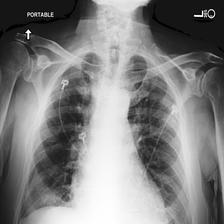

In [7]:
#show_image(mimic_img_tensor)
image_mimic

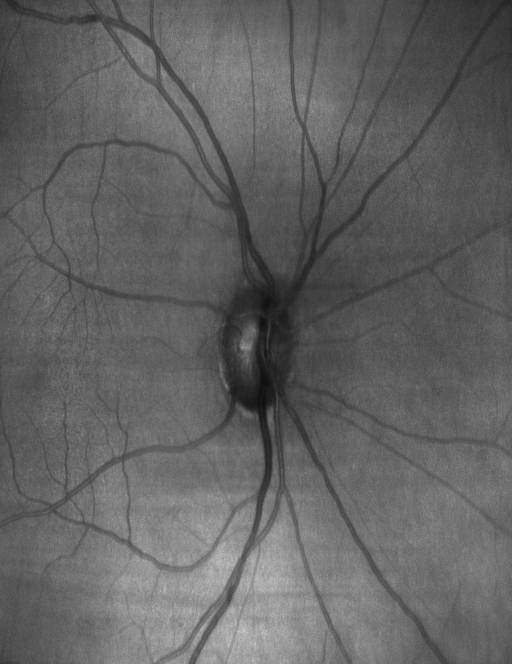

In [8]:
#show_image(medeval_img_tensor)
image_medeval

### Prompts

In [9]:
def get_prompt(text_prompt):
    conversation = [
        {
            "role": "user",
            "content": [
                {"type": "image"},
                {"type": "text", "text": text_prompt}
            ]
        }
    ]
        
    text_prompt, conv = processor.apply_chat_template(conversation, assistant_message=None, system_message=None)

    print(f"Text prompt: {text_prompt}")

    return text_prompt, conv

print()
print('MIMIC: ')
mimic_text_prompt, mimic_conv = get_prompt(text_mimic)

print()
print('MEDEVAL: ')
medeval_img_tensor, medeval_conv = get_prompt(text_medeval)


MIMIC: 
Text prompt: [INST] <<SYS>>
 Always reply something.
<</SYS>>

<image>

Patient Information:
- Age: 74.0
- Sex: Male
- Race: White
- ViewPosition: AP
- Procedure description: CHEST (PORTABLE AP)
- Summary:                                  FINAL REPORT
 AP CHEST, 4:52 P.M., ___
 
 HISTORY:  ___-year-old man after right thoracentesis.
 
 Small right pneumothorax is new following right thoracentesis.  Opacification
 in the right lower lung is probably atelectasis.  Followup advised to monitor
 the volume of pleural air and exclude the possibility of pulmonary bleeding. 
 Left lung clear.  Mild cardiac enlargement, unchanged.
 
 ___ discussed these findings by telephone at the time of dictation.


Based on the provided patient information and the associated chest X-ray image, does the patien has any condition (Pleural Effusion, Atelectasis, Cardiomegaly, Consolidation, Edema, Enlarged Cardiomediastinum, Fracture, Lung Lesion, Lung Opacity, Pleural Other, Pneumonia, or Pneumothorax

In [10]:
print('MIMIC: ')
inputs_dict_mimic = processor.prepare_inputs(mimic_text_prompt, image_mimic, mimic_conv)

print(f"Input tokens shape: {inputs_dict_mimic['input_ids'].shape}")
print(f"Image shape: {inputs_dict_mimic['images'].shape}")

print('MEDEVAL: ')
inputs_dict_medeval = processor.prepare_inputs(medeval_img_tensor, image_medeval, medeval_conv)

print(f"Input tokens shape: {inputs_dict_medeval['input_ids'].shape}")
print(f"Image shape: {inputs_dict_medeval['images'].shape}")

MIMIC: 
Input tokens shape: torch.Size([1, 347])
Image shape: torch.Size([1, 3, 336, 336])
MEDEVAL: 
Input tokens shape: torch.Size([1, 536])
Image shape: torch.Size([1, 3, 336, 336])


### Inference

In [11]:
image_size = (336, 336)

# generate the response
with torch.inference_mode():
    outputs_mimic = model.generate(
        inputs_dict_mimic['input_ids'],
        images=inputs_dict_mimic['images'],
        do_sample=False,
        max_new_tokens=512,
        use_cache=True,
        return_dict_in_generate=True,
        output_attentions=True,
    )

print('MIMIC')
text_mimic = processor.tokenizer.decode(outputs_mimic["sequences"][0][inputs_dict_mimic["input_ids"].shape[1]:]).strip()
print(text_mimic)

"""
# generate the response
with torch.inference_mode():
    outputs_medeval = model.generate(
        inputs_dict_medeval['input_ids'],
        images=inputs_dict_medeval['images'],
        do_sample=False,
        max_new_tokens=512,
        use_cache=True,
        return_dict_in_generate=True,
        output_attentions=True,
    )

print('MEDEVAL')
text_medeval = processor.tokenizer.decode(outputs_medeval["sequences"][0][inputs_dict_medeval["input_ids"].shape[1]:]).strip()
print(text_medeval)
"""


/gpfs/users/restrepoda/.conda/envs/biomed-gpt/lib/python3.11/site-packages/transformers/generation/utils.py:1270: UserWarning: You have modified the pretrained model configuration to control generation. This is a deprecated strategy to control generation and will be removed soon, in a future version. Please use a generation configuration file (see https://huggingface.co/docs/transformers/main_classes/text_generation )
  warnings.warn(


MIMIC
Yes, the patient has a condition. The chest X-ray image shows a small right pneumothorax, which is a new finding following right thoracentesis. </s>


'\n# generate the response\nwith torch.inference_mode():\n    outputs_medeval = model.generate(\n        inputs_dict_medeval[\'input_ids\'],\n        images=inputs_dict_medeval[\'images\'],\n        do_sample=False,\n        max_new_tokens=512,\n        use_cache=True,\n        return_dict_in_generate=True,\n        output_attentions=True,\n    )\n\nprint(\'MEDEVAL\')\ntext_medeval = processor.tokenizer.decode(outputs_medeval["sequences"][0][inputs_dict_medeval["input_ids"].shape[1]:]).strip()\nprint(text_medeval)\n'

In [12]:
input_ids = inputs_dict_mimic["input_ids"][0]
output_ids = outputs_mimic["sequences"][0][input_ids.shape[0]:]
output_attentions = outputs_mimic["attentions"]

### Attention

In [13]:
len(output_attentions) # 39 tokens generated
len(output_attentions[0]) # 32 layers in the first token
output_attentions[0][0].shape # 1 batch, 32 heads, N_TOKENS, N_TOKENS

torch.Size([1, 32, 922, 922])

In [14]:
# constructing the llm attention matrix
aggregated_prompt_attention = []
for i, layer in enumerate(output_attentions[0]):
    
    layer_attns = layer.squeeze(0) # remove batch size
    #print(layer_attns.shape)
    
    attns_per_head = layer_attns.mean(dim=0) # Average all the attentions across the head
    #print(attns_per_head.shape)

    # Make 0 the bos token attention
    cur = attns_per_head[:-1].cpu().clone()
    # following the practice in `aggregate_llm_attention`
    # we are zeroing out the attention to the first <bos> token
    # for the first row `cur[0]` (corresponding to the next token after <bos>), however,
    # we don't do this because <bos> is the only token that it can attend to
    cur[1:, 0] = 0.
    cur[1:] = cur[1:] / cur[1:].sum(-1, keepdim=True) # Normalize the attentions (without bos token)
    aggregated_prompt_attention.append(cur) # N_tokens x N_tokens

# This is for generation 0, we should add the attention for the other generations
aggregated_prompt_attention = torch.stack(aggregated_prompt_attention).mean(dim=0)

# llm_attn_matrix will be of torch.Size([N, N])
# where N is the total number of input (both image and text ones) + output tokens
llm_attn_matrix = heterogenous_stack(
    [torch.tensor([1])]
    + list(aggregated_prompt_attention) 
    + list(map(aggregate_llm_attention, output_attentions))
)

In [15]:
llm_attn_matrix.shape

torch.Size([961, 961])

In [16]:
# identify length or index of tokens
input_token_len = model.get_vision_tower().num_patches + len(input_ids) - 1 # -1 for the <image> token
vision_token_start = torch.where(input_ids == IMAGE_TOKEN_INDEX)[0].item()
vision_token_end = vision_token_start + model.get_vision_tower().num_patches
output_token_len = len(output_ids)
output_token_start = input_token_len
output_token_end = input_token_len + output_token_len

# Text token indices:
text_token_indices = list(range(0, vision_token_start)) + list(range(vision_token_end, output_token_start))
# Output token indices
output_token_indices = list(range(output_token_start, output_token_end))

922 Yes             0.0676
923 ,               0.0705
924 the             0.0477
925 patient         0.0556
926 has             0.0568
927 a               0.0378
928 condition       0.0423
929 .               0.0458
930 The             0.0414
931 chest           0.0565
932 X               0.0680
933 -               0.0548
934 ray             0.0572
935 image           0.0461
936 shows           0.0476
937 a               0.0400
938 small           0.0401
939 right           0.0429
940 p               0.0370
941 neum            0.0332
942 oth             0.0388
943 or              0.0470
944 ax              0.0477
945 ,               0.0390
946 which           0.0303
947 is              0.0457
948 a               0.0393
949 new             0.0436
950 finding         0.0411
951 following       0.0422
952 right           0.0408
953 th              0.0393
954 or              0.0292
955 ac              0.0449
956 entes           0.0370
957 is              0.0373
958 .               0.0349
9

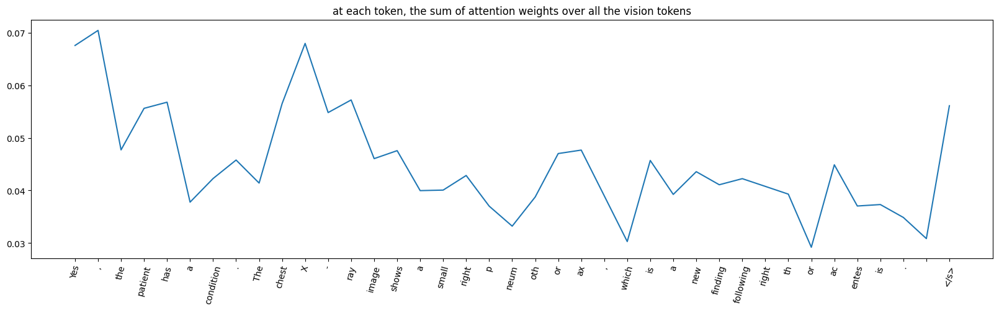

In [17]:
# look at the attention weights over the vision tokens
overall_attn_weights_over_vis_tokens = []
for i, (row, token) in enumerate(
    zip(
        llm_attn_matrix[input_token_len:], 
        output_ids.tolist()
    )
):
    print(
         i + input_token_len, 
         f"{processor.tokenizer.decode(token, add_special_tokens=False).strip():<15}", 
         f"{row[vision_token_start:vision_token_end].sum().item():.4f}"
     )

    overall_attn_weights_over_vis_tokens.append(
        row[vision_token_start:vision_token_end].sum().item()
    )

# plot the trend of attention weights over the vision tokens
fig, ax = plt.subplots(figsize=(20, 5))
ax.plot(overall_attn_weights_over_vis_tokens)
ax.set_xticks(range(len(overall_attn_weights_over_vis_tokens)))
ax.set_xticklabels(
    [processor.tokenizer.decode(token, add_special_tokens=False).strip() for token in output_ids.tolist()],
    rotation=75
)
ax.set_title("at each token, the sum of attention weights over all the vision tokens");

## Vision Attentions

In [18]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

############################################
##  Calculate & Visualize Image Attention ##
############################################

def calculate_image_attention(
    llm_attn_matrix,         # 2D array (full seq_len x seq_len) that merges the average attentions from LLM
    vit_attn_matrix,         # 2D array [n_image_tokens, n_image_tokens]
    tokenizer,
    image,
    output_ids,
    vision_token_start,
    vision_token_end,
    output_token_start,
    output_token_end,
    patch_grid_size=24,
    num_images_per_row=8,
    overlay=True,
    return_attentions=True,
    display=True
):
    """
    - llm_attn_matrix: (total_seq_len, total_seq_len) final LLM attn, typically after averaging layers & heads.
    - vit_attn_matrix: Each entry is the aggregated patch-level attention from the ViT model. Shape = (num_image_tokens, num_image_tokens).
    - tokenizer: Your LLaVA or LLaVA-Med tokenizer to decode tokens or do any conversions.
    - image: The original PIL (or np.array) image to overlay.
    - output_ids: List of generated token IDs (for labeling).
    - vision_token_start, vision_token_end: The slice of positions in the LLM's sequence that correspond to image tokens.
    - output_token_start, output_token_end: The slice that correspond to *generated* tokens.
    - patch_grid_size: Usually 24 (336 / 14).
    - overlay: If True, overlay the heatmap on top of the original image. If False, just show raw heatmap.
    - return_attentions: if True, returns a list of per‐generated‐token patch‐attention arrays.
    """

    # Convert the PIL image to numpy BGR array (like your show_mask_on_image usage).
    # If image is PIL, do: np_img = np.array(image)[:, :, ::-1]
    # If image is a cv2 image, adapt accordingly.
    np_img = np.array(image)[:, :, ::-1]

    generated_token_indices = list(range(output_token_start, output_token_end))
    num_generated_tokens = len(generated_token_indices)

    
    # If we're going to display, set up the figure once
    if display:
        num_rows = num_generated_tokens // num_images_per_row
        if num_generated_tokens % num_images_per_row != 0:
            num_rows += 1
        fig, axes = plt.subplots(
            num_rows, 
            num_images_per_row, 
            figsize=(10, 10 * num_rows / num_images_per_row), 
            dpi=150
        )
        plt.subplots_adjust(wspace=0.05, hspace=0.2)

        # If there's only one row, make axes into a list
        if num_rows == 1 and num_images_per_row == 1:
            axes = np.array([axes])
        elif num_rows == 1:
            axes = axes[np.newaxis, :]


    

    # To store patch-level attention arrays
    patch_attn_list = []

    # Iterate over each generated token
    #for idx, ax in enumerate(axes.flatten()):
    for idx in range(num_generated_tokens):
        
        # The position of this token in the LLM’s sequence
        cur_token_pos = generated_token_indices[idx]
        # Pull out how that single token attends to all vision tokens
        # shape: (vision_token_count,)
        attn_weights_over_vis = llm_attn_matrix[cur_token_pos, vision_token_start:vision_token_end]
        
        # Multiply each vision-token weight by the corresponding patch attention in the ViT
        # vit_attn_matrix should have shape [n_vision_tokens, n_vision_tokens].
        # attn_weights_over_vis has shape [n_vision_tokens].
        # For each patch i, we sum over all vision tokens
        patch_attention = []
        for patch_i, patch_vit_map in enumerate(vit_attn_matrix):
            # patch_vit_map might be shape [patch_grid_size^2].
            patch_attention.append(patch_vit_map * attn_weights_over_vis[patch_i])
        patch_attention = torch.stack(patch_attention, dim=0).sum(dim=0)

        # Reshape to (patch_grid_size, patch_grid_size)
        patch_attention = patch_attention.reshape(patch_grid_size, patch_grid_size)
        patch_attention = patch_attention / (patch_attention.max() + 1e-8)

        # Optionally store this patch attention map
        if return_attentions:
            patch_attn_list.append(patch_attention.detach().cpu().numpy())

        if display:
            # Identify the correct axis
            row_idx = idx // num_images_per_row
            col_idx = idx % num_images_per_row
            ax = axes[row_idx, col_idx] if len(axes.shape) == 2 else axes[row_idx][col_idx]
            
            # Now scale up to full image resolution
            patch_attention_t = patch_attention.unsqueeze(0).unsqueeze(0).float()  # [1,1,H,W]
            # Resample to match the actual image shape
            big_attn = F.interpolate(
                patch_attention_t, 
                size=(image.size[1], image.size[0]), 
                mode='bicubic', 
                align_corners=False
            ).squeeze().cpu().numpy()
    
            # Overlay image and attention
            img_with_attn, heatmap = show_mask_on_image(np_img, big_attn)
            ax.imshow(heatmap if not overlay else img_with_attn)
    
            # Label with the token text
            token_str = tokenizer.decode([output_ids[idx]], add_special_tokens=False).strip()
            ax.set_title(token_str, fontsize=7, pad=1)
            ax.axis("off")

    if display:
        total_plots = num_rows * num_images_per_row
        if total_plots > num_generated_tokens:
            # For each unused subplot, remove it
            for leftover_idx in range(num_generated_tokens, total_plots):
                row_idx = leftover_idx // num_images_per_row
                col_idx = leftover_idx % num_images_per_row
                fig.delaxes(axes[row_idx, col_idx])

        plt.suptitle("Image Attention by Generated Token", fontsize=10)
        plt.show()


    if return_attentions:
        return patch_attn_list


In [19]:
# Enable attention in the vision config
model.get_vision_tower().vision_tower.config.output_attentions = True

# Forward pass the images explicitly
with torch.no_grad():
    vision_outputs = model.get_vision_tower().vision_tower(
        pixel_values=inputs_dict_mimic["images"],
        output_attentions=True,
        return_dict=True
    )

# Patch-level attentions for the CLIP layers
vit_attentions = vision_outputs.attentions
# len(vit_attentions) # 24 attention layers
# vit_attentions[0].shape # Batch, heads, tokens, tokens


# Aggregate the visual encoder over all the layers and heads:
# vis_attn_matrix will be of torch.Size([N, N])
# where N is the number of vision tokens/patches

# Pass those to your aggregator
vit_attn_matrix = aggregate_vit_attention(
    vit_attentions, # ViT attentions
    select_layer=model.get_vision_tower().select_layer, # Layer selected
    all_prev_layers=True # True will average attention from all layers until the selected layer
)

# Compute the number of patches per side
patch_size = 14  # CLIP patch size
grid_size = image_size[0] // patch_size  # Assuming square images (336x336) then 24 x 24 patches

vit_attn_matrix.shape

torch.Size([576, 576])

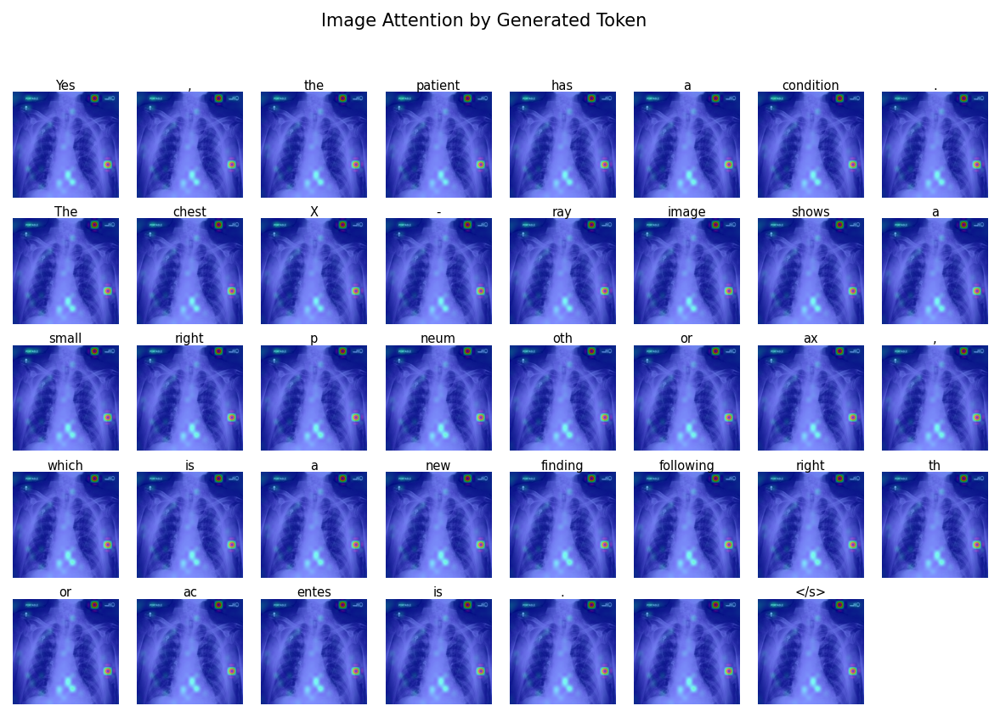

In [20]:
visual_att = calculate_image_attention(
    llm_attn_matrix,         # 2D array (full seq_len x seq_len) that merges the average attentions from LLM
    vit_attn_matrix,         # 2D array [n_image_tokens, n_image_tokens] 
    processor.tokenizer,
    image_mimic,
    output_ids,
    vision_token_start,
    vision_token_end,
    output_token_start,
    output_token_end,
    patch_grid_size=grid_size,
    num_images_per_row=8,
    overlay=True,
    display=True
)

### Vision-Text Attentions

In [29]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from IPython.display import display, HTML
import html
import weasyprint

def clean_token(token):
    """
    Remove the subword marker (e.g., "▁") from the token and adjust spacing.
    """
    if token.startswith("▁"):
        return token[1:]
    if token == '<0x0A>':
        return " "
    return token

def html_to_png(html_str, output_png="attention.png"):
    "Convert attention to png"
    html_obj = weasyprint.HTML(string=html_str)
    html_obj.write_png(output_png)

def build_text_html_line(attn_row, input_tokens, gen_token):
    # Normalize attention for color mapping
    norm_attn = (attn_row - attn_row.min()) / (attn_row.max() - attn_row.min() + 1e-8)
    token_html = ""
    for token, weight in zip(input_tokens, norm_attn):
        safe_token = html.escape(token)
        token_html += f'<span style="background-color: rgba(0,0,255,{weight:.2f}); padding:1px; margin:1px;">{safe_token}</span>'
    safe_gen_token = html.escape(gen_token)
    return f"<div style='font-family: monospace; margin-bottom: 0px;'>{token_html}</div>" 
    #return f"<div style='font-family: monospace; margin-bottom: 0px;'><strong>{safe_gen_token}:</strong> {token_html}</div>"



def calculate_text_attention(
    llm_attn_matrix,
    text_token_indices,
    output_token_indices,
    tokenizer,
    input_ids,
    output_ids,
    save=False,
    display_attention=True
):
    """
    Creates and visualizes a heatmap:
      rows = each generated token
      cols = each input text token
    using a single 2D attention matrix (llm_attn_matrix).

    Args:
      llm_attn_matrix: shape [total_seq_len, total_seq_len], the LLM attention 
                       already averaged across heads/layers as you did for image attn.
      text_token_indices: list of positions for the "input text" in the prompt 
                          (excluding image tokens).
      output_token_indices: list of positions for the "generated tokens" in the final seq.
      tokenizer: to decode the input_ids / output_ids for labeling.
      input_ids: the original prompt tokens (including text + image placeholder).
      output_ids: the newly generated tokens, same as the ones you used for image attn.
    """

    # We'll build an array [num_output_tokens, num_text_tokens]
    num_output_tokens = len(output_token_indices)
    num_text_tokens   = len(text_token_indices)

    attention_array = []

    for out_i, out_token_pos in enumerate(output_token_indices):
        # Row in llm_attn_matrix that corresponds to this output token
        row = llm_attn_matrix[out_token_pos]

        # Slice out only the text token columns, ignoring vision tokens
        # shape = (num_text_tokens,)
        text_token_indices = torch.tensor(text_token_indices, dtype=torch.long)
        text_attn = row[text_token_indices]


        # (Optional) if there's a chance that some part of the row is all zeros 
        # (e.g. during early generation), you can renormalize:
        sum_val = text_attn.sum()
        if sum_val > 0:
            text_attn = text_attn / sum_val

        attention_array.append(text_attn.cpu().numpy())

    # Attention to every out token # shape [num_output_tokens, num_text_tokens]
    attention_array = np.stack(attention_array, axis=0) 

    if display_attention:
        # Build token labels
        # Remove image placeholder from input_ids
        #vision_token_start = torch.where(input_ids == IMAGE_TOKEN_INDEX)[0].item()
        #input_ids_not_img = torch.cat([input_ids[0:vision_token_start], input_ids[vision_token_start+1:]])
        
        vision_token_positions = (input_ids == IMAGE_TOKEN_INDEX).nonzero(as_tuple=True)[0]
        
        if len(vision_token_positions) > 0:
            vision_token_start = vision_token_positions[0].item()
            input_ids_not_img = torch.cat([input_ids[:vision_token_start], input_ids[vision_token_start+1:]])
        else:
            input_ids_not_img = input_ids
    
        # Convert tokens to strings and clean them.
        input_tokens = tokenizer.convert_ids_to_tokens(input_ids_not_img)
        input_tokens = [clean_token(tok) for tok in input_tokens]
        gen_tokens   = tokenizer.convert_ids_to_tokens(output_ids)
        gen_tokens   = [clean_token(tok) for tok in gen_tokens]

        
        for i in range(attention_array.shape[0]):
            html_lines = build_text_html_line(attention_array[i], input_tokens, gen_tokens[i])
            display(HTML(html_lines))
            
            if save:
                try:
                    # Optionally, render it to an image
                    out_filename = f"gen_token_{i}_({gen_tokens[i]}).png"
                    html_to_png(html_lines, out_filename)
                except:
                    print("")

    return attention_array


In [30]:
# Call the function
attention_array = calculate_text_attention(
    llm_attn_matrix=llm_attn_matrix,
    text_token_indices=text_token_indices,
    output_token_indices=output_token_indices,
    tokenizer=processor.tokenizer,
    input_ids=input_ids,
    output_ids=output_ids,
    display_attention=True,
    save=True
)

/gpfs/workdir/restrepoda/tmp/ipykernel_252016/1500173727.py:76: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  text_token_indices = torch.tensor(text_token_indices, dtype=torch.long)


### Multimodal attention

In [37]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display, HTML
import html
import os

def visualize_image_and_text_attentions(
    # LLM and ViT attentions
    llm_attn_matrix,         # shape [total_seq_len, total_seq_len]
    vit_attn_matrix,         # shape [n_vision_tokens, patch_grid_size^2] (aggregated ViT patch attention)
    # indexing info
    text_token_indices,      # which positions in the prompt are text tokens (excluding image tokens)
    output_token_indices,    # which positions are generated tokens
    vision_token_start,      # start index of vision tokens in the LLM input
    vision_token_end,        # end index of vision tokens
    output_token_start,      # start index of generated tokens
    output_token_end,        # end index of generated tokens
    # token data & prompt
    tokenizer,
    input_ids,
    output_ids,
    # image data
    image,
    patch_grid_size=24,
    overlay=True,
    show_figure=True,
    save_dir='attentions',
    image_attention_dir='images',
    text_attention_dir="text",
    save=False
    
):
    """
    Gathers both image and text attention for each generated token, then displays
    them one by one:
      1) The patch-level image overlay.
      2) The text-token highlight for that same token.

    Args:
      llm_attn_matrix: 2D array [total_seq_len, total_seq_len], LLM cross-token attentions
      vit_attn_matrix: 2D array [n_vision_tokens, patch_grid_size^2], aggregated from ViT
      text_token_indices: list of positions in the LLM prompt that correspond to text (not image).
      output_token_indices: list of positions for generated tokens.
      vision_token_start, vision_token_end: index range for vision tokens.
      output_token_start, output_token_end: index range for output tokens.
      tokenizer, input_ids, output_ids: for decoding tokens & building text highlights.
      image: PIL image used for overlay.
      patch_grid_size: typically 24 for 336×336 images with 14×14 patches.
      overlay: whether to overlay heatmap on image or show it separately.
    """

    if save:
        image_attention_dir_path = os.path.join(save_dir, image_attention_dir)
        text_attention_dir_path = os.path.join(save_dir, text_attention_dir)
        os.makedirs(image_attention_dir_path, exist_ok=True) 
        os.makedirs(text_attention_dir_path, exist_ok=True) 
    
    # GET IMAGE ATTENTIONS (no plotting)
    
    img_attn_list = calculate_image_attention(
        llm_attn_matrix=llm_attn_matrix,
        vit_attn_matrix=vit_attn_matrix,
        tokenizer=tokenizer,
        image=image,
        output_ids=output_ids,
        vision_token_start=vision_token_start,
        vision_token_end=vision_token_end,
        output_token_start=output_token_start,
        output_token_end=output_token_end,
        patch_grid_size=patch_grid_size,
        overlay=overlay,
        return_attentions=True,   
        display=False  
    )
    
    # GET TEXT ATTENTIONS
    text_attn_array = calculate_text_attention(
        llm_attn_matrix=llm_attn_matrix,
        text_token_indices=text_token_indices,
        output_token_indices=output_token_indices,
        tokenizer=tokenizer,
        input_ids=input_ids,
        output_ids=output_ids,
        display_attention=False 
    )


    # Optionally show in the notebook
    if show_figure:
        fig, ax = plt.subplots(figsize=(4,4), dpi=200)
        ax.imshow(image)
        ax.set_title(f"Original Image", fontsize=20)
        ax.axis("off")
        if save:
            plt.savefig(f"{image_attention_dir_path}/Original_image.jpg")
        plt.show()


    #print(len(img_attn_list))
    #print(img_attn_list[0].shape)

    #print(len(text_attn_array))
    #print(text_attn_array[0].shape)
    
    # LOOP PER GENERATED TOKEN & DISPLAY BOTH    
    num_generated_tokens = len(output_token_indices)
    np_img = np.array(image)[:, :, ::-1]   # BGR if needed
    
    # Convert token IDs to strings
    vision_token_positions = (input_ids == IMAGE_TOKEN_INDEX).nonzero(as_tuple=True)[0]
    
    if len(vision_token_positions) > 0:
        vision_token_start = vision_token_positions[0].item()
        input_ids_not_img = torch.cat([input_ids[:vision_token_start], input_ids[vision_token_start+1:]])
    else:
        input_ids_not_img = input_ids
    input_tokens = tokenizer.convert_ids_to_tokens(input_ids_not_img)
    gen_tokens   = tokenizer.convert_ids_to_tokens(output_ids)
        
    input_tokens = [clean_token(tok) for tok in input_tokens]
    gen_tokens   = [clean_token(tok) for tok in gen_tokens]
    
    # Iterate over each generated token
    for i in range(num_generated_tokens):
        
        # IMAGE ATTENTION
        patch_attention = img_attn_list[i]  # shape (patch_grid_size, patch_grid_size)
        
        # Upscale to image resolution
        patch_t = torch.tensor(patch_attention).unsqueeze(0).unsqueeze(0).float()
        big_attn = F.interpolate(
            patch_t,
            size=(image.size[1], image.size[0]),
            mode='bicubic',
            align_corners=False
        ).squeeze().cpu().numpy()
        
        # Show the image overlay in a figure
        from IPython.display import display

        
        # We assume you have a show_mask_on_image() function
        img_with_attn, heatmap = show_mask_on_image(np_img, big_attn)
        final_img = heatmap if not overlay else img_with_attn


        # Optionally show in the notebook
        if show_figure:
            fig, ax = plt.subplots(figsize=(4,4), dpi=200)
            ax.imshow(final_img)
            ax.set_title(f"Image attn → '{gen_tokens[i].strip()}'", fontsize=20)
            ax.axis("off")
            if save:
                plt.savefig(f"{image_attention_dir_path}/Image attn → '{gen_tokens[i].strip()}'.jpg")
            plt.show()

        
        # Convert final_img (NumPy, BGR) into a PIL image (RGB)
        final_img_rgb = final_img#[:, :, ::-1]  
        overlay_pil = Image.fromarray(final_img_rgb)


        # TEXT ATTENTION HIGHLIGHT
        text_row = text_attn_array[i]
        html_str = build_text_html_line(text_row, input_tokens, gen_tokens[i])
        if show_figure:
            display(HTML(html_str))
            
            if save:
                try:
                    # Optionally, render it to an image
                    out_filename = f"{text_attention_dir_path}/gen_token_{i}_({gen_tokens[i]}).png"
                    html_to_png(html_str, out_filename)
                except:
                    print("")


/gpfs/workdir/restrepoda/tmp/ipykernel_252016/1500173727.py:76: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  text_token_indices = torch.tensor(text_token_indices, dtype=torch.long)


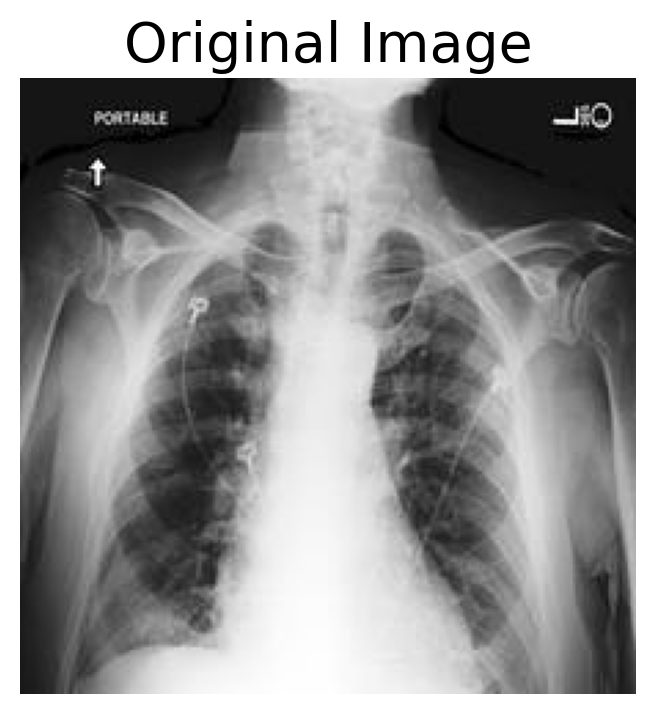

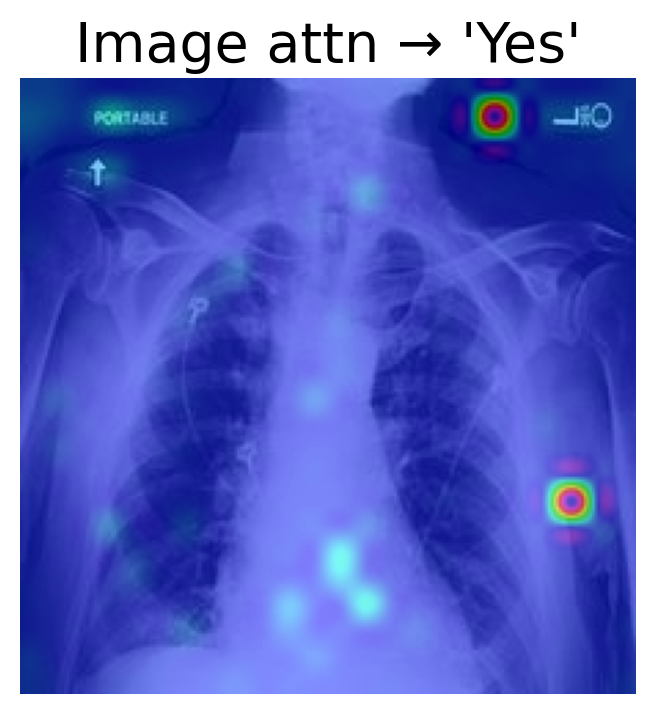

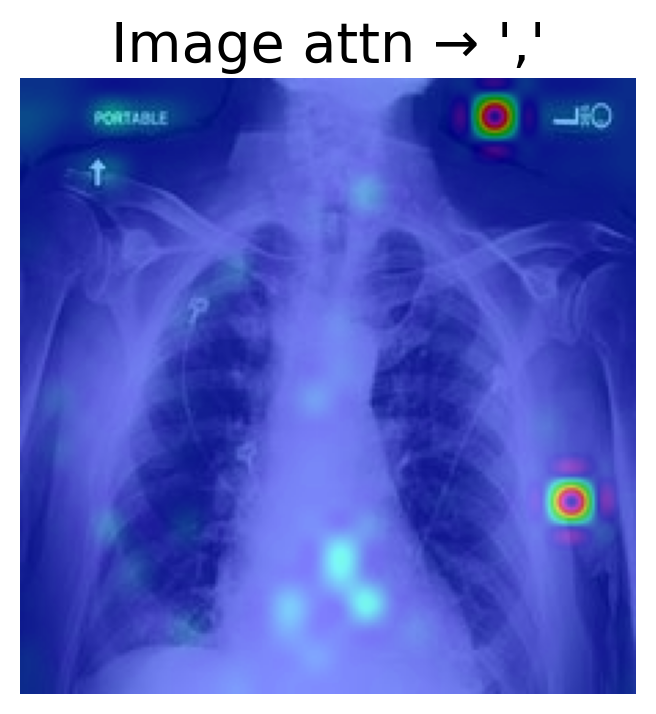

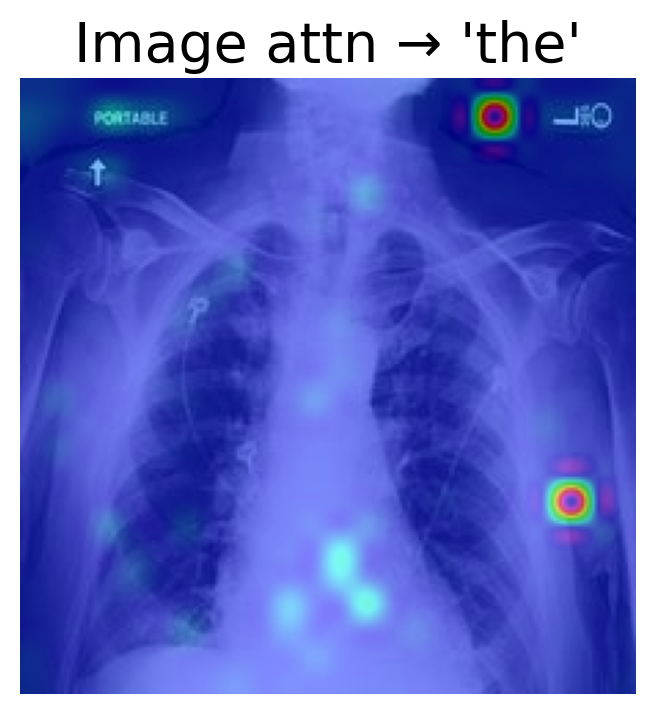

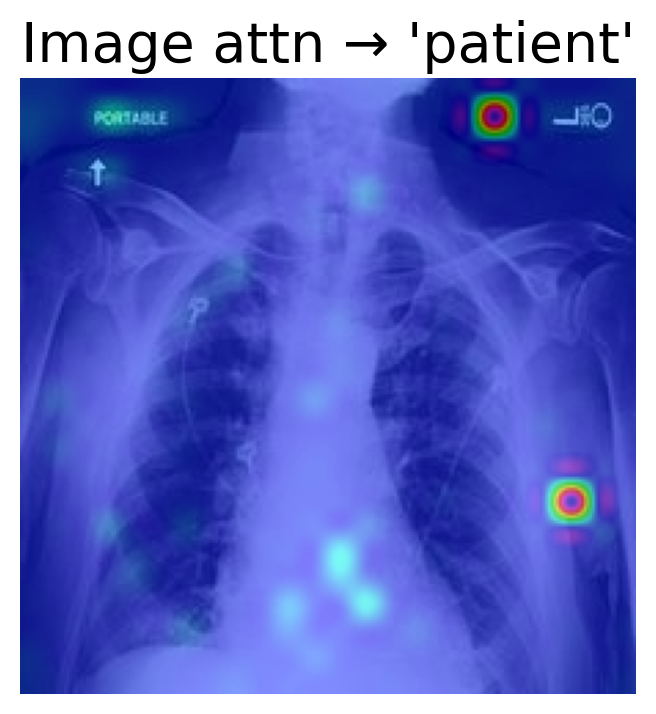

...

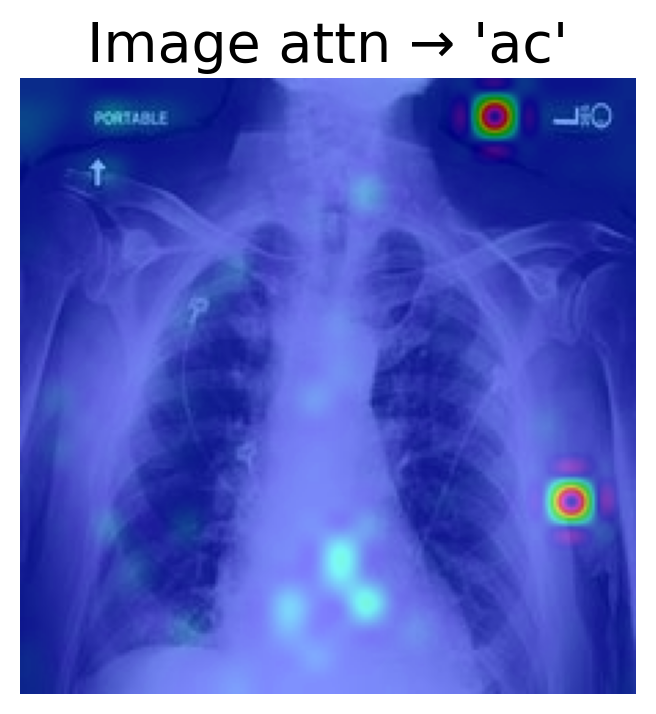

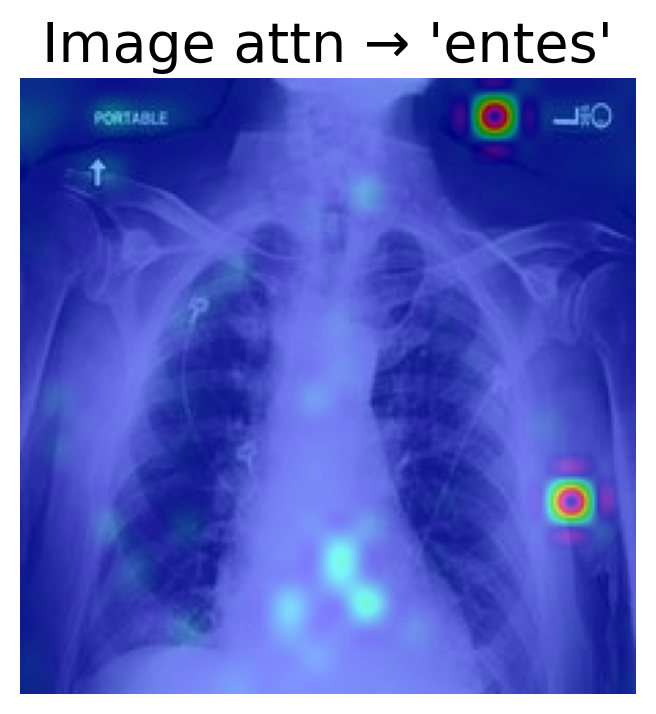

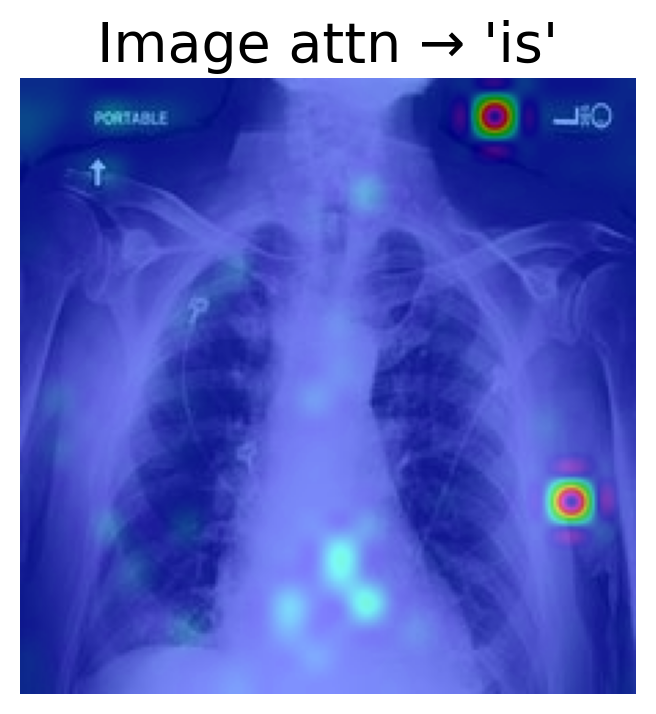

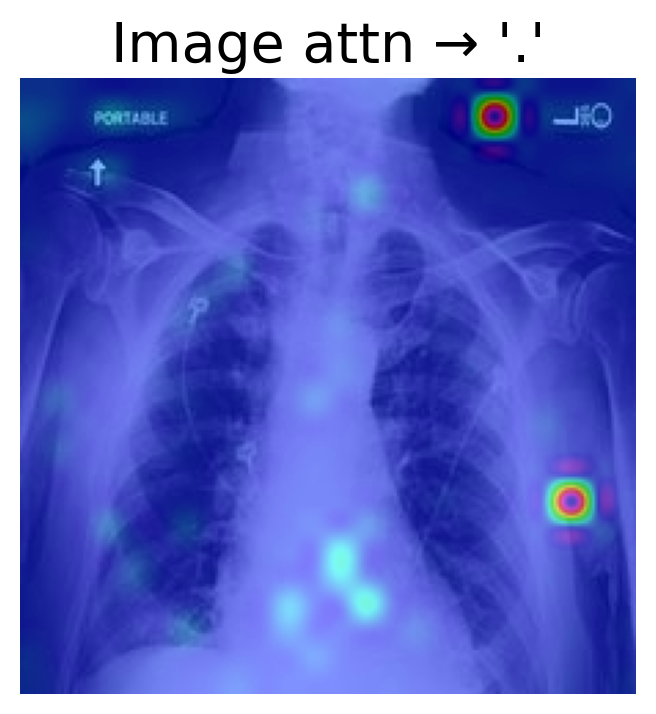

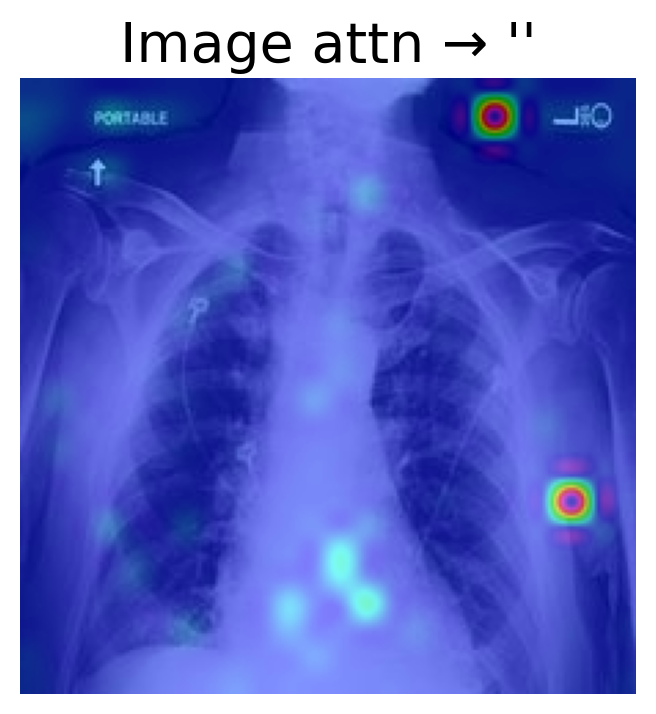

FileNotFoundError: [Errno 2] No such file or directory: "attentions/images/Image attn → '</s>'.jpg"

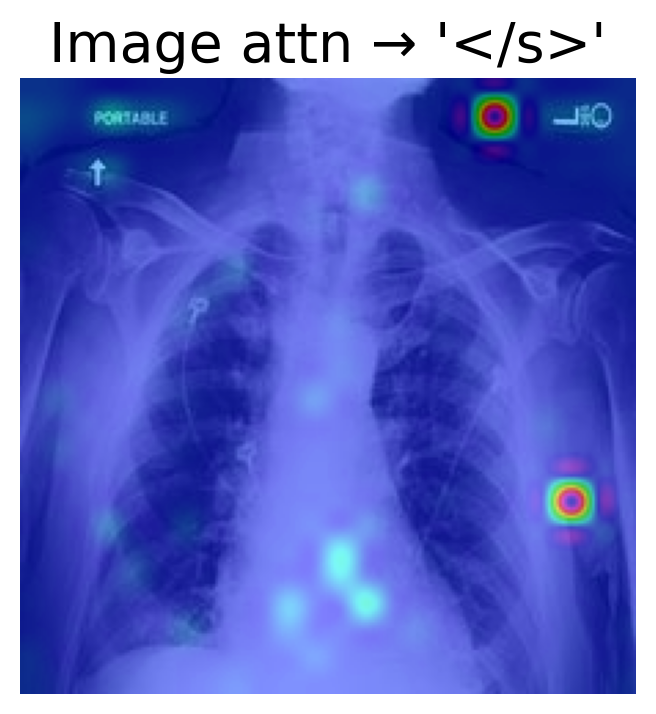

In [38]:
visualize_image_and_text_attentions(
    # LLM and ViT attentions
    llm_attn_matrix,         # shape [total_seq_len, total_seq_len]
    vit_attn_matrix,         # shape [n_vision_tokens, patch_grid_size^2] (aggregated ViT patch attention)
    # indexing info
    text_token_indices,      # which positions in the prompt are text tokens (excluding image tokens)
    output_token_indices,    # which positions are generated tokens
    vision_token_start,      # start index of vision tokens in the LLM input
    vision_token_end,        # end index of vision tokens
    output_token_start,      # start index of generated tokens
    output_token_end,        # end index of generated tokens
    # token data & prompt
    processor.tokenizer,
    input_ids,
    output_ids,
    # image data
    image_mimic,
    patch_grid_size=24,
    overlay=True,
    show_figure=True,
    save=True
)